# Há alguma maneira de prever o resultado da Mega-sena ?

# Introdução

A Mega-sena, uma das loterias mais populares no Brasil, atrai milhões de jogadores em busca do cobiçado prêmio milionário. No entanto, a imprevisibilidade dos números sorteados levanta a questão: seria viável prever o resultado da Mega-sena por meio de dados históricos e técnicas de ciência de dados? Este projeto tem como objetivo explorar essa questão intrigante, analisando padrões nos resultados passados e empregando métodos estatísticos. Ao investigar essa temática, almejamos oferecer insights valiosos sobre a aleatoriedade dos sorteios e o potencial de aplicação de métodos analíticos na previsão de resultados de jogos de azar.

In [76]:
# Carregando todas as bibliotecas importantes para nossa analise
import pandas as pd
import requests
from os.path import exists
import matplotlib.pyplot as plt
import seaborn as sns
import random

Iremos excutar um script de Web Scraping para coletar os dados do site https://asloterias.com.br/

In [77]:


# Função para baixar os dados
def download_data():
    url = 'https://asloterias.com.br/download_excel.php'

    headers = {
        'Accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.7',
        'Accept-Language': 'pt-BR,pt;q=0.9,en-US;q=0.8,en;q=0.7',
        'Content-Type': 'application/x-www-form-urlencoded',
        'Referer': 'https://asloterias.com.br/download-todos-resultados-mega-sena',
        'Sec-Fetch-Dest': 'document',
        'Sec-Fetch-Mode': 'navigate',
        'Sec-Fetch-Site': 'same-origin',
        'Upgrade-Insecure-Requests': '1'
    }

    data = {
        'l': 'ms',
        't': 't',
        'o': 'c',
        'f1': '',
        'f2': ''
    }

    # Envia uma solicitação POST para a URL especificada
    try:
        response = requests.post(url, headers=headers, data=data)
        response.raise_for_status()
    except requests.exceptions.RequestException as e:
        print('Erro ao baixar os dados:', e)
        return

    # Salva o conteúdo da resposta em um arquivo
    with open('megasena_data.xlsx', 'wb') as f:
        f.write(response.content)

# Função para ler os dados
def read_data():
    try:
        # Lê os dados do arquivo Excel, pulando as primeiras 6 linhas
        return pd.read_excel('megasena_data.xlsx', skiprows=6)
    except FileNotFoundError:
        print('Arquivo não encontrado')
    except pd.errors.ParserError:
        print('Erro ao ler o arquivo')
    return None

# Função principal
def main():
    # Verifica se o site está online
    try:
        response = requests.get('https://asloterias.com.br')
        response.raise_for_status()
    except requests.exceptions.RequestException as e:
        print('O site está offline:', e)
        return

    # Verifica se o arquivo já foi baixado
    file_exists = exists('megasena_data.xlsx')

    if not file_exists:
        # Se o arquivo não existe, baixa os dados
        download_data()
        megasena_data = read_data()
        if megasena_data is not None:
            print('Dados baixados')
    else:
        # Se o arquivo existe, lê os dados
        megasena_data = read_data()
        if megasena_data is not None:
            print('Dados carregados')

    # Exibe as primeiras 10 linhas dos dados
    if megasena_data is not None:
        print(megasena_data.head(10))

# Chama a função principal
main()

Dados carregados
   Concurso        Data  bola 1  bola 2  bola 3  bola 4  bola 5  bola 6
0      2677  18/01/2024       3       7      32      34      42      54
1      2676  16/01/2024       4       6      14      19      22      29
2      2675  13/01/2024       1      26      31      34      42      45
3      2674  11/01/2024       8      14      15      21      23      46
4      2673  09/01/2024       4      27      35      45      52      56
5      2672  06/01/2024      10      13      20      40      43      56
6      2671  04/01/2024      16      19      43      53      57      58
7      2670  31/12/2023      21      24      33      41      48      56
8      2669  16/12/2023       4       7      16      35      46      54
9      2668  14/12/2023       1      27      30      41      46      57


In [78]:
# Carrega os dados da Mega-sena
global megasena_data
megasena_data = read_data()

Iremos calcular as estatísticas descritivas para os números sorteados da Mega-sena. A função describe() é usada para gerar estatísticas como média, desvio padrão, mínimo, máximo e quartis para os números sorteados.

In [79]:
# Calcular estatísticas descritivas
estatisticas_descritivas = megasena_data[['bola 1', 'bola 2', 'bola 3', 'bola 4', 'bola 5', 'bola 6']].describe()

print(estatisticas_descritivas)

            bola 1       bola 2       bola 3       bola 4       bola 5  \
count  2677.000000  2677.000000  2677.000000  2677.000000  2677.000000   
mean      8.610385    17.340306    26.356369    35.067613    43.558087   
std       6.995585     9.140634     9.971260     9.766878     9.049899   
min       1.000000     2.000000     3.000000     8.000000    11.000000   
25%       3.000000    10.000000    19.000000    28.000000    38.000000   
50%       7.000000    16.000000    26.000000    35.000000    45.000000   
75%      12.000000    23.000000    33.000000    42.000000    51.000000   
max      50.000000    51.000000    56.000000    58.000000    59.000000   

            bola 6  
count  2677.000000  
mean     52.166231  
std       7.014533  
min      22.000000  
25%      49.000000  
50%      54.000000  
75%      58.000000  
max      60.000000  


Com base nessas estatísticas descritivas, podemos tirar os seguintes insights:

Tendência Central: As médias das bolas sorteadas variam entre 8 e 52, com a bola 6 tendo a maior média. Isso pode indicar uma tendência central em torno desses valores para cada bola.

Dispersão: Os desvios padrão mostram a dispersão dos números sorteados em torno da média. Bolas com desvios padrão maiores têm maior variabilidade nos números sorteados.

Frequência de Sorteio: A contagem mostra que todas as bolas foram sorteadas aproximadamente a mesma quantidade de vezes (2676), o que sugere uma distribuição uniforme dos sorteios.

Intervalos e Quartis: Os quartis e os valores mínimo e máximo fornecem informações sobre a distribuição dos números sorteados e os intervalos em que a maioria dos sorteios ocorre.

Com base nesses insights, é possível realizar análises mais aprofundadas sobre os padrões de sorteio da Mega-sena e identificar possíveis tendências ou características dos números sorteados.


Com base nos dados disponíveis, será gerado um histograma representando os números sorteados da Mega-sena. Isso nos permitirá visualizar de forma mais clara a distribuição dos números sorteados e identificar possíveis padrões ou tendências.

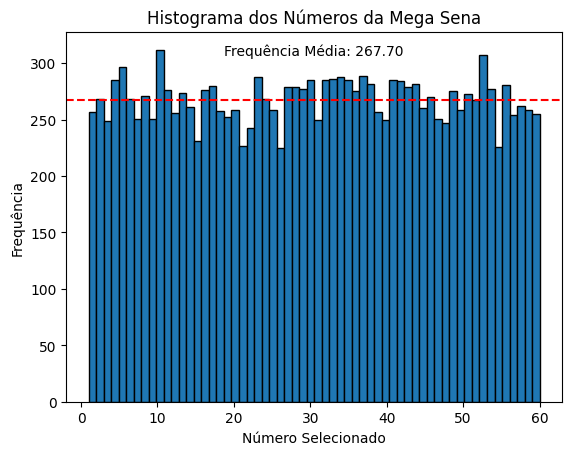

In [80]:
numeros_mega_sena = megasena_data[['bola 1', 'bola 2', 'bola 3', 'bola 4', 'bola 5', 'bola 6']].to_numpy(copy=True).ravel()

# Criando o histograma
hist, bin_edges, _ = plt.hist(
    numeros_mega_sena,
    bins=60,
    edgecolor='k',
)

# Calculando a frequência média
frequencia_media = hist.mean()

# Adicionando uma linha pontilhada vermelha representando a frequência média
plt.axhline(frequencia_media, c='r', ls='--')

# Adicionando título e rótulos aos eixos
plt.title(f'Histograma dos Números da Mega Sena')
plt.xlabel('Número Selecionado')
plt.ylabel('Frequência')

# Adicionando texto informativo sobre a frequência média
plt.text(
    x=0.5, y=0.95,
    s=f'Frequência Média: {frequencia_media:.2f}',
    ha='center', va='center',
    transform=plt.gca().transAxes,
    bbox=dict(facecolor='white', edgecolor='white', boxstyle='round,pad=0.5')
)

# Exibindo o gráfico
plt.show()

Iremos criar um gráfico de dispersão para visualizar a relação entre a bola sorteada e a data do sorteio. Essa representação visual nos permitirá identificar possíveis padrões ou correlações entre essas variáveis.

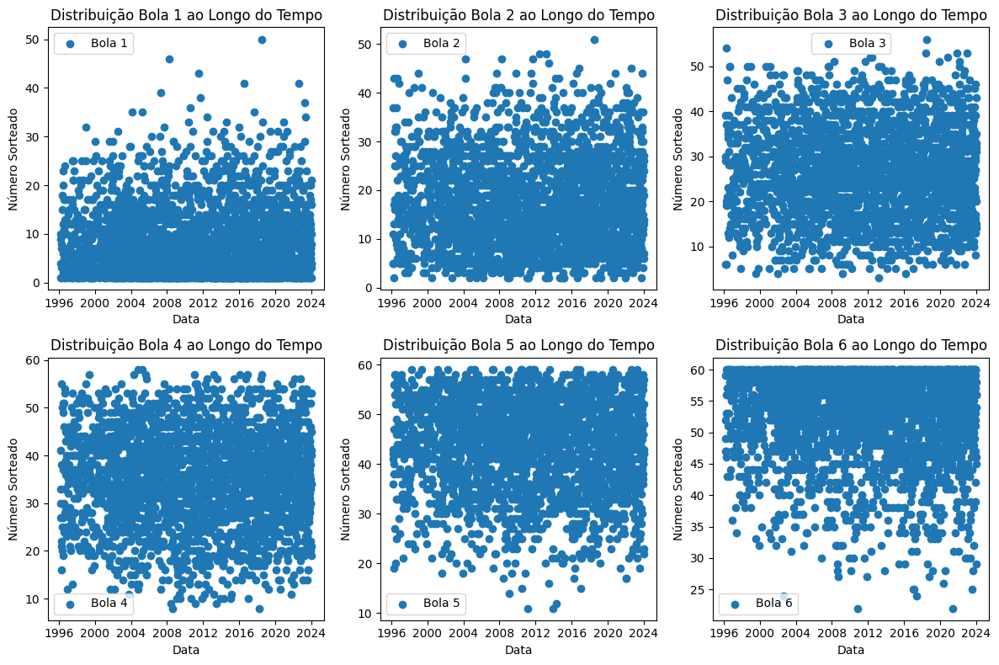

In [81]:
megasena_data['Data'] = pd.to_datetime(megasena_data['Data'], format='%d/%m/%Y')

# Criar gráficos de dispersão para cada bola ao longo do tempo
plt.figure(figsize=(12, 8))

for i in range(1, 7):
    plt.subplot(2, 3, i)
    plt.scatter(megasena_data['Data'], megasena_data[f'bola {i}'], label=f'Bola {i}')
    plt.title(f'Distribuição Bola {i} ao Longo do Tempo')
    plt.xlabel('Data')
    plt.ylabel('Número Sorteado')
    plt.legend()

plt.tight_layout()
plt.show()

Elaboremos um conjunto de gráficos de barras e gráficos de linha por ano, com o intuito de identificar tendências temporais, variações na distribuição dos números sorteados e possíveis padrões sazonais. Essa análise pode fornecer insights valiosos sobre a variação dos números sorteados ao longo dos anos.

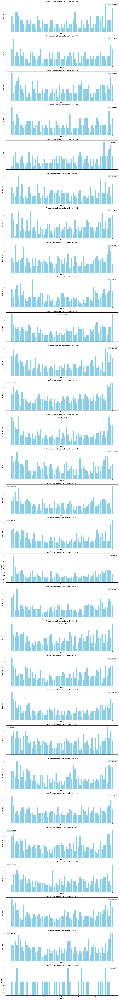

In [82]:
# Criar colunas adicionais para o ano e o mês
megasena_data['Ano'] = megasena_data['Data'].dt.year
megasena_data['Mês'] = megasena_data['Data'].dt.month

todos_numeros = megasena_data[['bola 1', 'bola 2', 'bola 3', 'bola 4', 'bola 5', 'bola 6']].values.flatten()


# Calcular a frequência de cada número
frequencia_numeros = pd.Series(todos_numeros).value_counts().sort_index()

# Calcular a frequência de cada número por ano
frequencia_numeros_por_ano = megasena_data.melt(id_vars=['Ano'], value_vars=['bola 1', 'bola 2', 'bola 3', 'bola 4', 'bola 5', 'bola 6'], var_name='Bola', value_name='Número')
frequencia_numeros_por_ano = frequencia_numeros_por_ano.groupby(['Ano', 'Bola', 'Número']).size().unstack().fillna(0).stack().reset_index(name='Frequência')

# Criar subplots para cada ano
anos = frequencia_numeros_por_ano['Ano'].unique()
num_subplots = len(anos)

fig, axs = plt.subplots(num_subplots, 1, figsize=(14, 4 * num_subplots), sharex=True)

for i, ano in enumerate(anos):
    dados_ano = frequencia_numeros_por_ano[frequencia_numeros_por_ano['Ano'] == ano]
    axs[i].bar(dados_ano['Número'], dados_ano['Frequência'], label=f'Ano {ano}', color='skyblue')
    axs[i].set_title(f'Frequência dos Números Sorteados em {ano}')
    axs[i].set_xlabel('Número')
    axs[i].set_ylabel('Frequência')
    axs[i].legend()

plt.tight_layout()
plt.show()

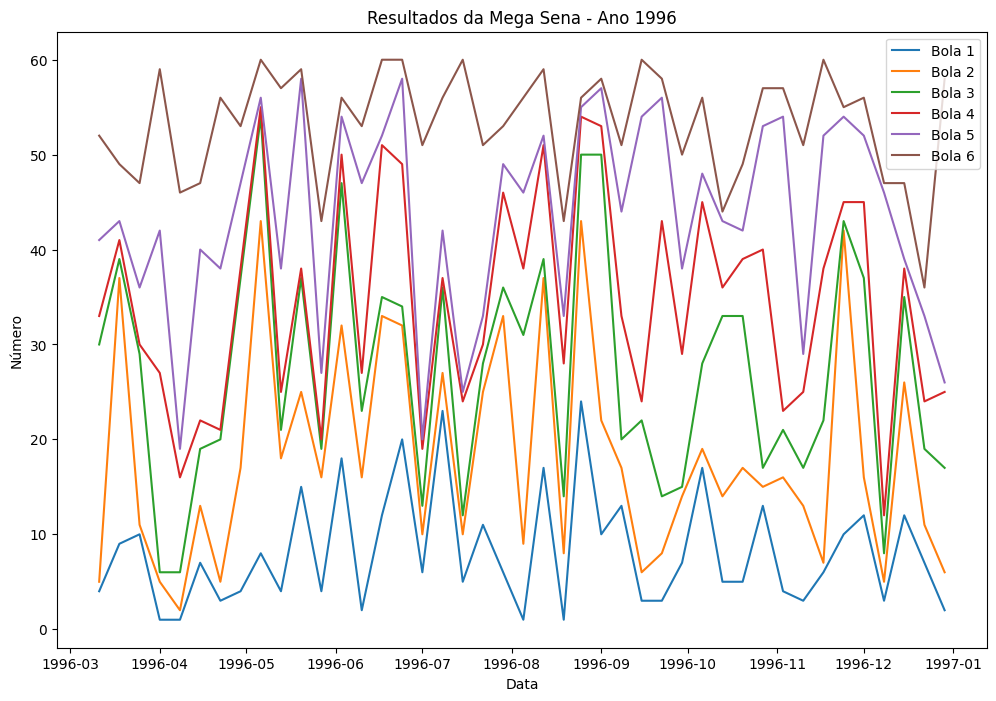

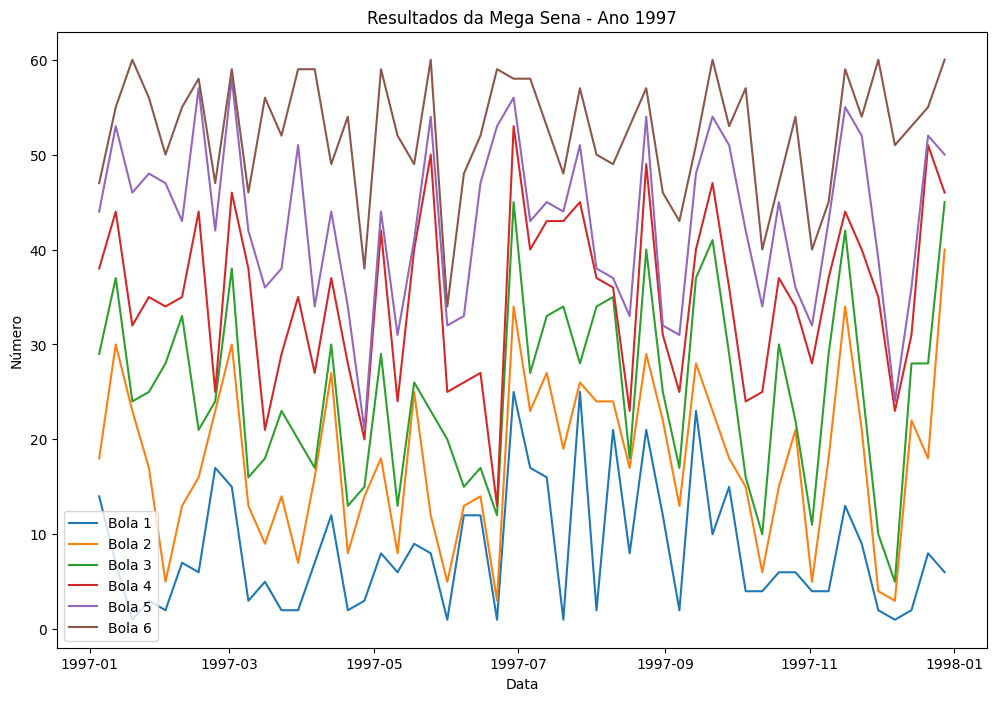

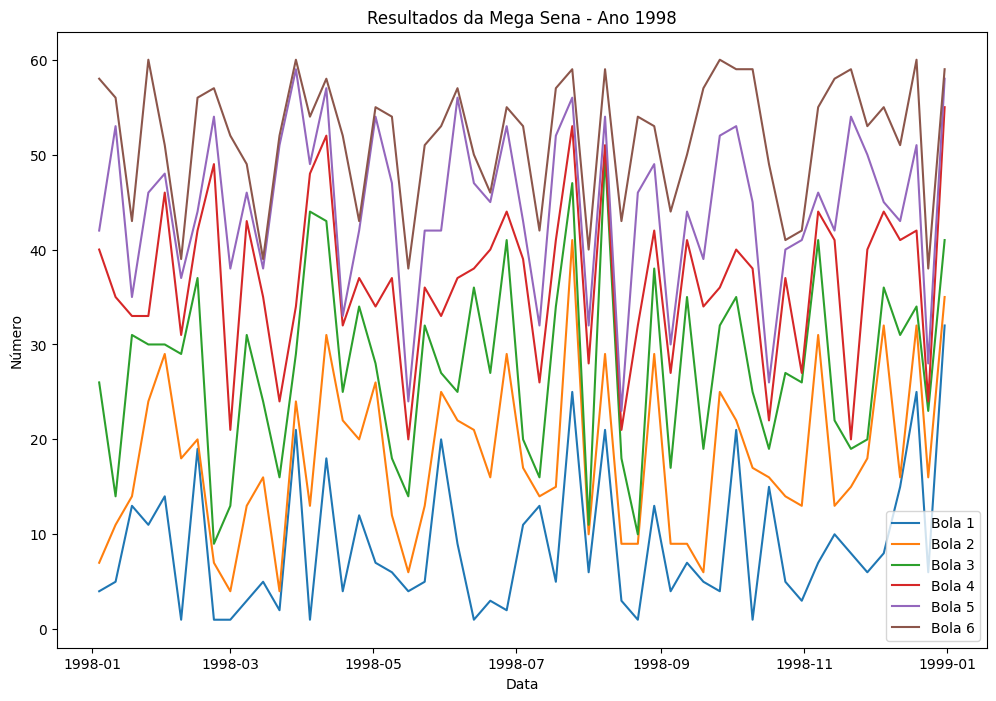

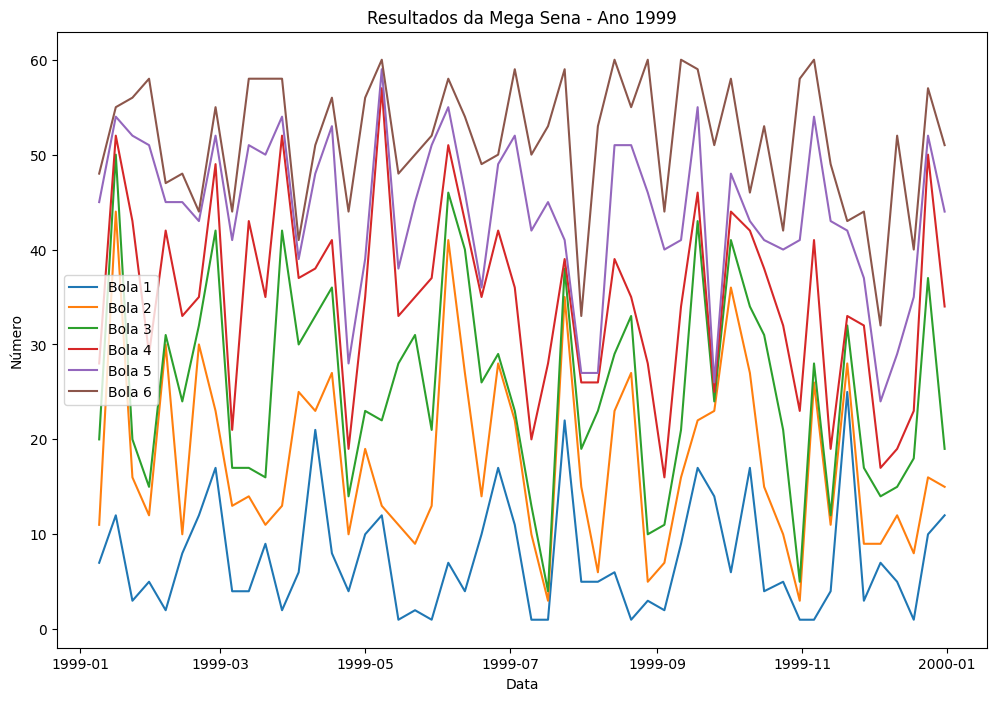

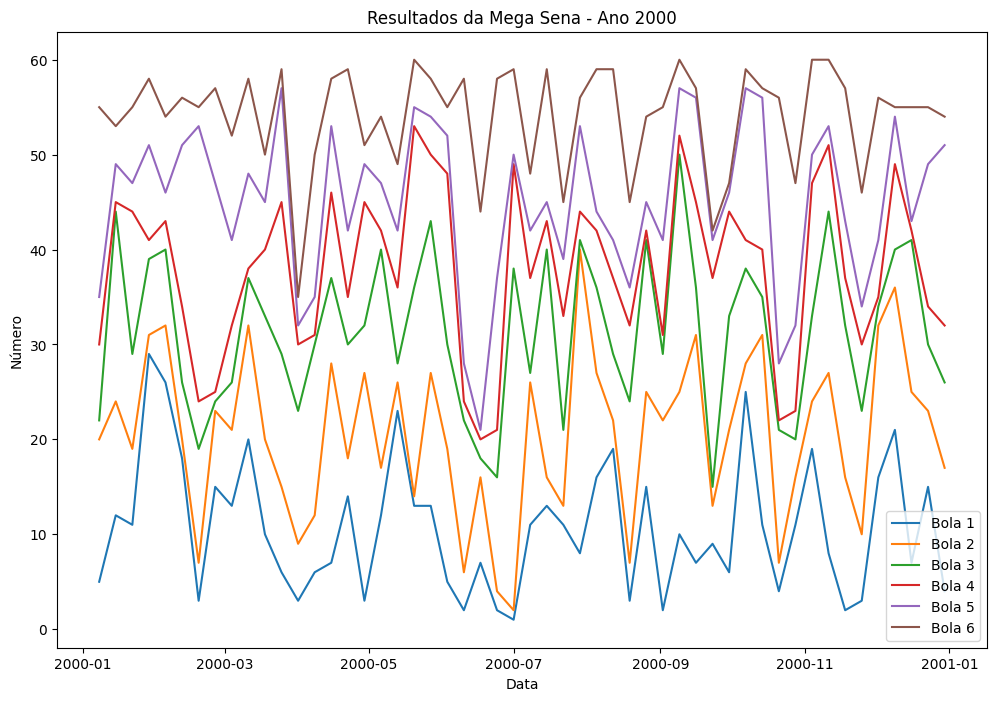

...

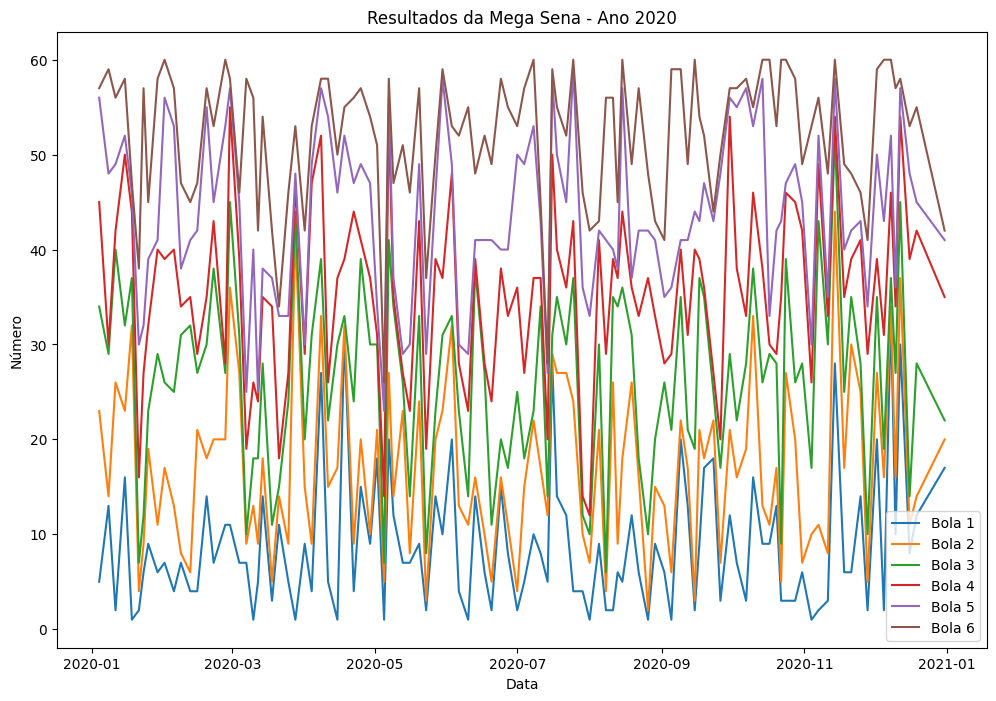

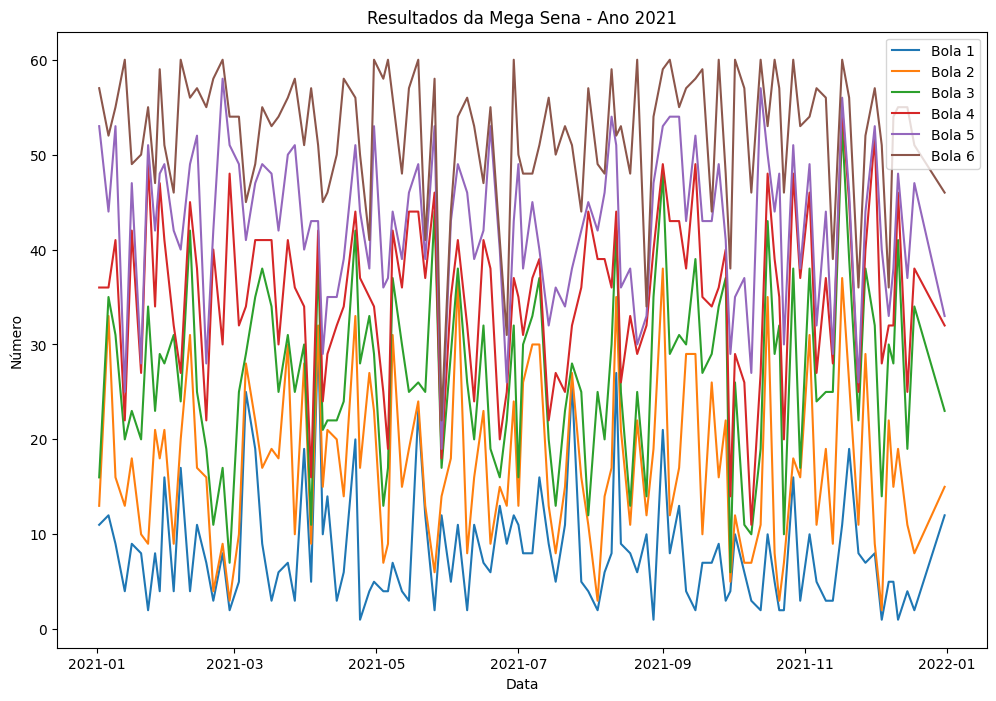

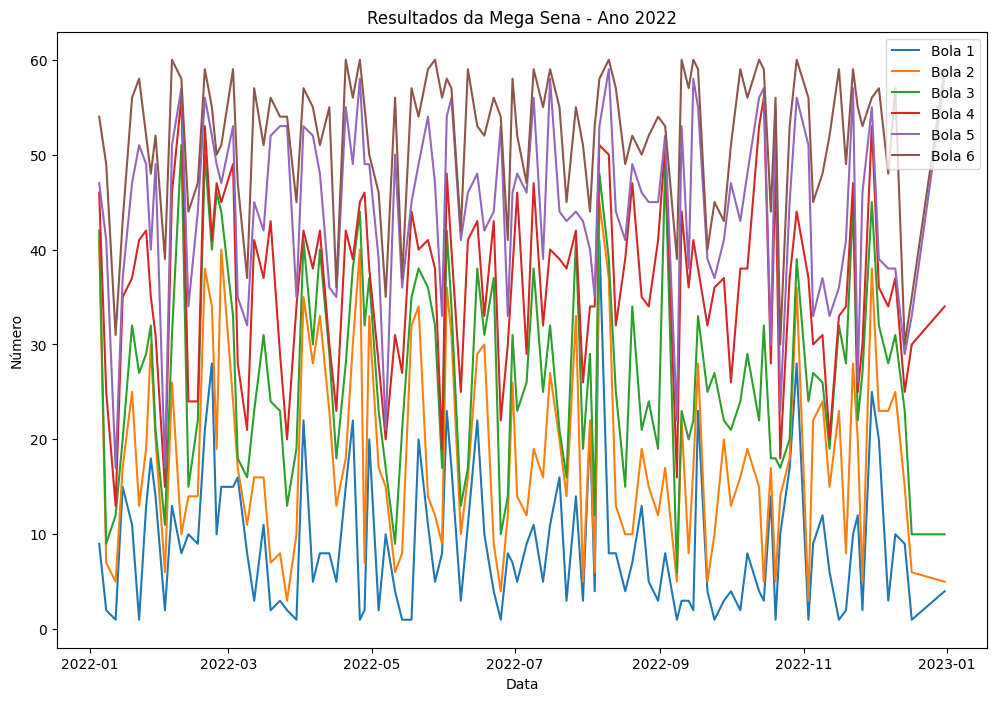

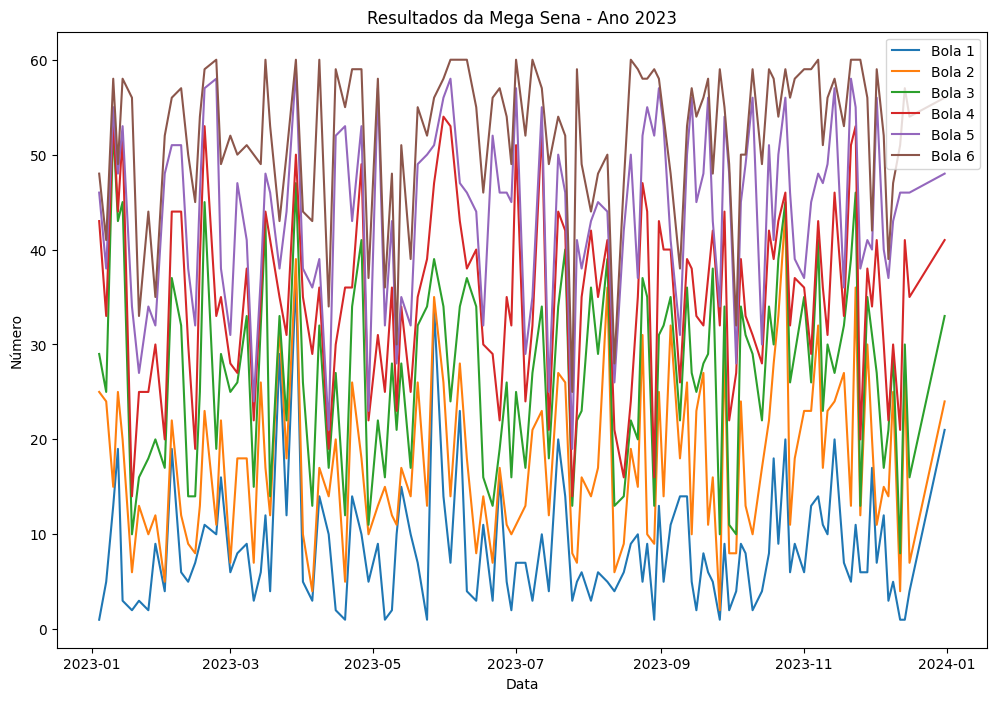

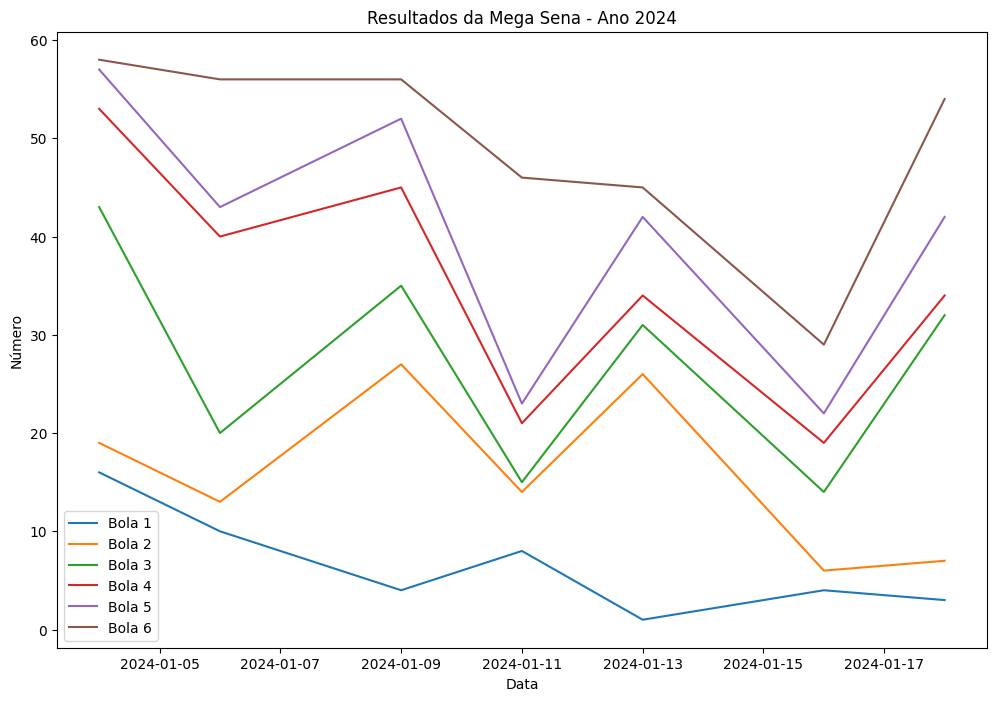

In [83]:
import matplotlib.pyplot as plt

# Converter a coluna 'Data' para o tipo datetime
megasena_data['Data'] = pd.to_datetime(megasena_data['Data'], format='%d/%m/%Y')

# Ordenar o dataframe pela coluna 'Data'
megasena_data = megasena_data.sort_values('Data')

# Plotar a série temporal para cada ano
years = megasena_data['Data'].dt.year.unique()
for year in years:
    df_year = megasena_data[megasena_data['Data'].dt.year == year]
    plt.figure(figsize=(12, 8))
    for bola in range(1, 7):
        plt.plot(df_year['Data'], df_year[f'bola {bola}'], label=f'Bola {bola}')
    plt.xlabel('Data')
    plt.ylabel('Número')
    plt.title(f'Resultados da Mega Sena - Ano {year}')
    plt.legend()
    plt.show()

Vamos gerar um gráfico de correlação para verificar a relação entre os números sorteados em pares consecutivos. Essa análise pode nos ajudar a identificar se há alguma correlação significativa entre os números sorteados em jogos consecutivos.

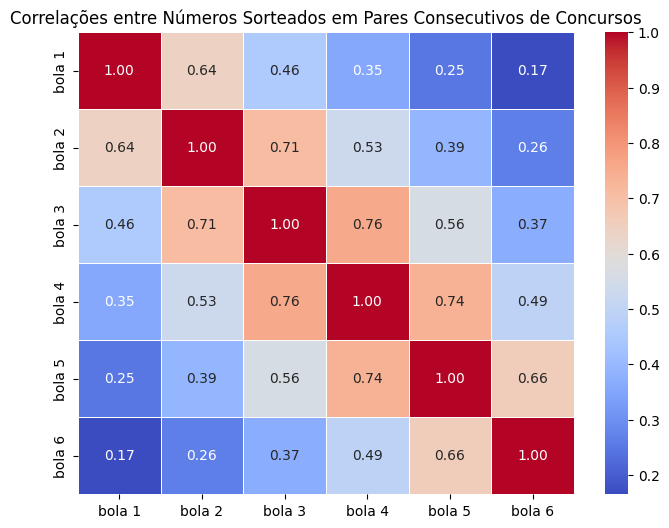

In [84]:
correlacoes_consecutivas = megasena_data[['bola 1', 'bola 2', 'bola 3', 'bola 4', 'bola 5', 'bola 6']].corr()

# Criar um heatmap usando Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(correlacoes_consecutivas, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlações entre Números Sorteados em Pares Consecutivos de Concursos')
plt.show()

Vamos gerar um gráfico que demonstre a evolução dos resultados da Mega-Sena ao longo do tempo. Essa análise nos fornecerá uma visualização da evolução dos resultados ao longo dos anos, permitindo a identificação de possíveis tendências e padrões.

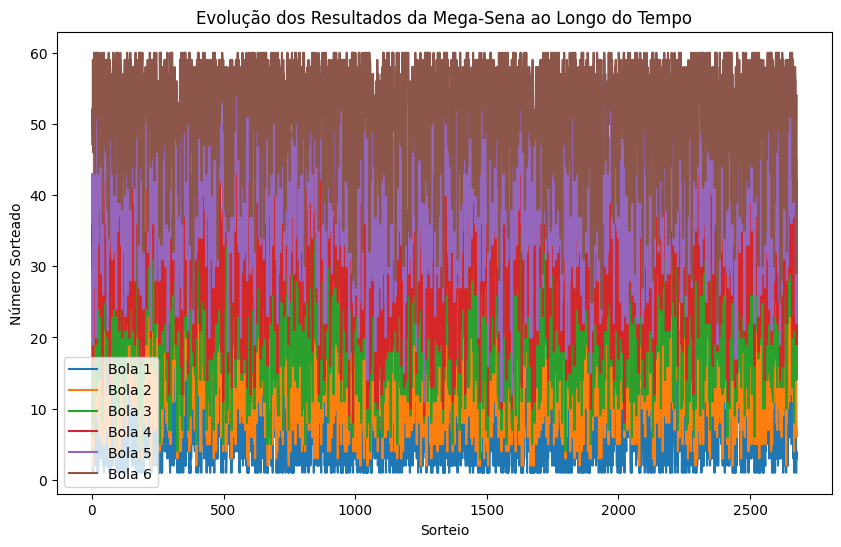

In [85]:
# Criar uma coluna numérica para representar os sorteios sequencialmente
megasena_data['Sorteio'] = range(1, len(megasena_data) + 1)

# Plotar a evolução dos resultados ao longo do tempo
plt.figure(figsize=(10, 6))
plt.plot(megasena_data['Sorteio'], megasena_data['bola 1'], label='Bola 1')
plt.plot(megasena_data['Sorteio'], megasena_data['bola 2'], label='Bola 2')
plt.plot(megasena_data['Sorteio'], megasena_data['bola 3'], label='Bola 3')
plt.plot(megasena_data['Sorteio'], megasena_data['bola 4'], label='Bola 4')
plt.plot(megasena_data['Sorteio'], megasena_data['bola 5'], label='Bola 5')
plt.plot(megasena_data['Sorteio'], megasena_data['bola 6'], label='Bola 6')

plt.title('Evolução dos Resultados da Mega-Sena ao Longo do Tempo')
plt.xlabel('Sorteio')
plt.ylabel('Número Sorteado')
plt.legend()
plt.show()

E por fim, gráficos de barras para cada posição das bolas sorteadas.

In [86]:
megasena_data =  megasena_data[['Concurso','Data','bola 1'	,'bola 2'	,'bola 3'	,'bola 4'	,'bola 5'	,'bola 6']]

In [87]:
# Seleciona as colunas com os números da Mega Sena
games = megasena_data.iloc[:, 2:]

# Nomeia as colunas para representar as posições dos números
positions = ['position_1', 'position_2', 'position_3', 'position_4', 'position_5', 'position_6']
games.columns = positions

# Exibe as primeiras linhas do DataFrame para confirmar as alterações
games.head()

,position_1,position_2,position_3,position_4,position_5,position_6
2676,4,5,30,33,41,52
2675,9,37,39,41,43,49
2674,10,11,29,30,36,47
2673,1,5,6,27,42,59
2672,1,2,6,16,19,46


In [88]:
# Seleciona as colunas de data e número do jogo
info = megasena_data.iloc[:, 0:2]

# Exibe as primeiras linhas do DataFrame para visualizar as informações
info.head()

,Concurso,Data
2676,1,1996-03-11
2675,2,1996-03-18
2674,3,1996-03-25
2673,4,1996-04-01
2672,5,1996-04-08


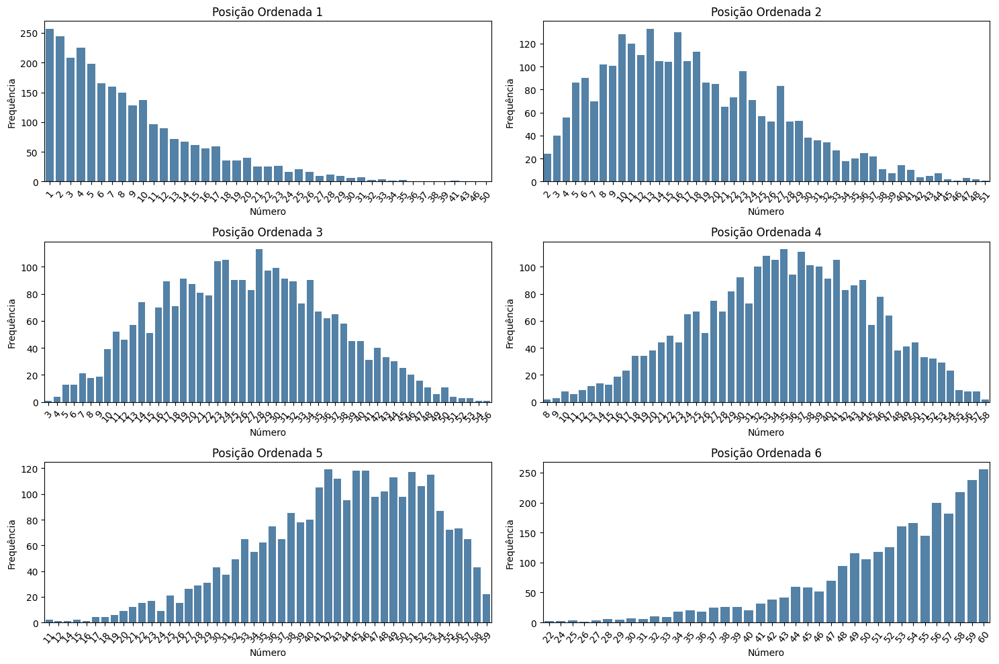

In [89]:
# Lista para armazenar as posições ordenadas
sorted_positions = []

# Loop para iterar sobre as posições e contar a frequência dos números
for i, position in enumerate(positions):
    sorted_positions.append(games[position].value_counts())

# Criação do subplot para exibir os gráficos ordenados
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(15, 10))  # 15, 10 -> largura, altura
axs = axs.flatten()

# Loop para plotar os gráficos de barras para cada posição
for i, position in enumerate(sorted_positions):
    sns.barplot(x=position.index, y=position.values, ax=axs[i], color="steelblue")  # Substitui o uso de palette por color
    axs[i].set_title(f"Posição Ordenada {i+1}")
    axs[i].set_xlabel('Número')
    axs[i].set_ylabel('Frequência')
    axs[i].tick_params(axis='x', labelrotation=50)

# Ajusta o layout para evitar sobreposição
plt.tight_layout()

# Exibe os gráficos
plt.show();

#Conclusões intermediárias:

Com base nessas análises estatísticas, é importante ressaltar que, de acordo com os princípios estatísticos e probabilísticos, não há métodos comprovados para prever os resultados da Mega-Sena. A loteria é um jogo de azar e os resultados são independentes, o que significa que não há uma maneira confiável de prever os números vencedores com base em padrões anteriores.Com base na análise dos gráficos plotados, não foi identificado nenhum padrão significativo nos resultados da Mega-Sena. Isso é consistente com a natureza aleatória e imprevisível dos resultados da loteria.

# 50.063.860
Dados da Associação Internacional de Transporte Aéreo (IATA), de 2021, mostram que o risco de um passageiro ter sofrido um acidente (fatal ou não) foi de 1 voo a cada 990 mil decolagens. Já a probabilidade de levar o prêmio principal da Mega com uma aposta simples, de 6 números, é de 1 para cada 50.063.860

Com base nas estatísticas, é possível identificar números que têm uma frequência de saída maior, o que pode aumentar suas chances de se tornar um ganhador. Vamos gerar seis números aleatórios e calcular quais têm maior tendência de sair, proporcionando a você uma oportunidade única de aumentar suas chances de vitória.

In [90]:
numeros_sorteio = games.to_numpy()

contagem_numeros = {}

# Itera sobre a coluna 'numeros_sorteio' e conta as ocorrências de cada número
for numeros_lista in numeros_sorteio:
    for numero in numeros_lista:
        if numero in contagem_numeros:
            contagem_numeros[numero] += 1
        else:
            contagem_numeros[numero] = 1

# Cria um DataFrame com as contagens ordenadas por frequência
df_contagem = pd.DataFrame(list(contagem_numeros.items()), columns=['Numero', 'Contagem']).sort_values(by='Contagem', ascending=False).reset_index(drop=True)

# Calcula o total de sorteios realizados
total_sorteios = df_contagem['Contagem'].sum()

# Calcula a probabilidade de cada número ser sorteado
df_contagem['Probabilidade'] = df_contagem['Contagem'] / total_sorteios * 100


# Cria um novo DataFrame com os números e suas maiores chances de não serem sorteados
df_maior_chance = df_contagem[['Numero','Probabilidade']].sort_values(by='Probabilidade', ascending=False).reset_index(drop=True)

Apresentando os números que mais tem chance de serem sorteados.

In [91]:
df_maior_chance

,Numero,Probabilidade
0,10,1.942473
1,53,1.911344
2,5,1.849085
3,37,1.799278
4,34,1.793052
5,23,1.793052
6,33,1.780600
7,4,1.774374
8,30,1.774374
9,41,1.774374


In [92]:
# Função para gerar uma lista de 6 números únicos de 1 a 60
def gerar_lista():
    return random.sample(range(1, 61), 6)

# Gerar 100 listas de 6 números
listas = [gerar_lista() for _ in range(100)]


In [93]:
resultados = []

# Calcular a média para cada sublista e adicionar à nova lista
for sublista in listas:
    valores_encontrados = df_maior_chance[df_maior_chance['Numero'].isin(sublista)]['Probabilidade']
    media_chances = valores_encontrados.mean()
    resultados.append((sublista, media_chances))

# Criar um DataFrame a partir da lista de tuplas
colunas = ['Lista Original', 'Média das Probabilidade']
df_resultados = pd.DataFrame(resultados, columns=colunas)

# Ordenar o DataFrame pela maior média das "Chance_% de todos os anos"
df_resultados = df_resultados.sort_values(by='Média das Probabilidade', ascending=False)

# Imprimir o DataFrame ordenado
print(df_resultados)



              Lista Original  Média das Probabilidade
74  [30, 34, 52, 41, 32, 23]                 1.761923
12  [23, 35, 11, 29, 32, 41]                 1.759847
29  [32, 41, 10, 51, 31, 34]                 1.756734
6   [10, 13, 17, 42, 52, 16]                 1.756734
47  [35, 27, 38, 28, 37, 13]                 1.751546
..                       ...                      ...
52   [50, 40, 31, 15, 46, 8]                 1.588636
93   [26, 58, 18, 8, 40, 45]                 1.583447
37  [18, 26, 21, 30, 58, 60]                 1.568920
11   [7, 60, 24, 15, 21, 11]                 1.564770
42   [55, 7, 16, 15, 57, 19]                 1.546092

[100 rows x 2 columns]


# Conclusão:

Através da análise estatística e do cálculo dos números com maior tendência de saída, você estará mais próximo da vitória na Mega-Sena. Este método oferece uma abordagem estratégica e embasada em dados, aumentando suas chances de se tornar o próximo ganhador. A sorte favorece os preparados, e com esses números, você estará pronto para alcançar a vitória.

In [94]:
#importar resultados para arquivo JSON
df_resultados.to_json('resultados.json', orient='records', lines=True)